<a href="https://colab.research.google.com/github/hiuri/GuerraNasEstrelasPython/blob/main/trab2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install numpy-stl

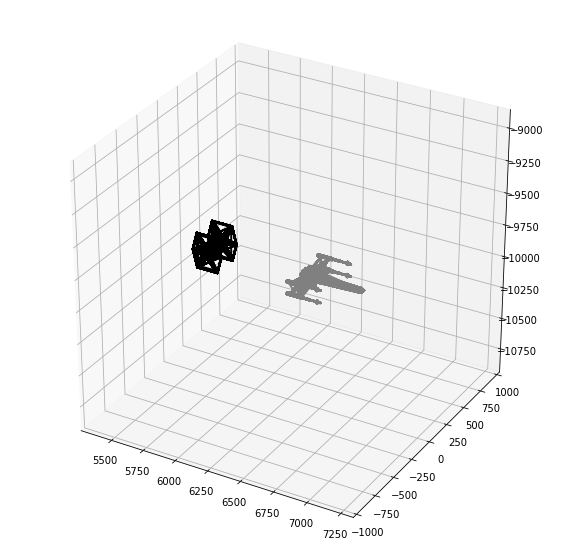

In [ ]:
from stl import mesh
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D, art3d  
from math import pi,cos,sin
from matplotlib import animation, rc

class Object():
    def __init__(self, points = [], center = []):
        self.center = center
        self.points = points

# Function for building the Rotation Matrix around the Z-axes
def rot3D(angle,axis):
  ang_rad = (angle/180)*np.pi
  if axis == 'z':
    R3D = np.array([[np.cos(ang_rad),-np.sin(ang_rad),0,0],[np.sin(ang_rad),np.cos(ang_rad),0,0],[0,0,1,0],[0,0,0,1]])
  elif axis == 'x':
    R3D = np.array([[1,0,0,0],[0,np.cos(ang_rad),-np.sin(ang_rad),0],[0,np.sin(ang_rad),np.cos(ang_rad),0],[0,0,0,1]])
  elif axis == 'y':
    R3D = np.array([[np.cos(ang_rad),0,np.sin(ang_rad),0],[0,1,0,0],[-np.sin(ang_rad),0,np.cos(ang_rad),0],[0,0,0,1]])
  else:
    R3D = np.eye(4,4)
  return R3D

# Function for building the Translation Matrix
def trans3D(dx,dy,dz):
  T3D = np.array([[1, 0, 0, dx],[0, 1, 0, dy],[0, 0, 1, dz], [0, 0, 0, 1]])
  return T3D

def sc3D(sx,sy,sz):
  S3D = np.array([[sx, 0, 0, 0],[0, sy, 0, 0],[0, 0, sz, 0], [0, 0, 0, 1]])
  return S3D


# Load the STL files and add the vectors to the plot
x_wing_mesh = mesh.Mesh.from_file('X_Wing.stl')
tie_fighter_mesh = mesh.Mesh.from_file('nave.stl')
# Get the x, y, z coordinates contained in the mesh structure that are the 
# vertices of the triangular faces of the object
x = x_wing_mesh.x.flatten()
y = x_wing_mesh.y.flatten()
z = x_wing_mesh.z.flatten()

# Create the 3D object from the x,y,z coordinates and add the additional array of ones to 
# represent the object using homogeneous coordinates
x_wing = np.array([x.T,y.T,z.T,np.ones(x.size)])

x = tie_fighter_mesh.x.flatten()
y = tie_fighter_mesh.y.flatten()
z = tie_fighter_mesh.z.flatten()

tie_fighter = np.array([x.T,y.T,z.T,np.ones(x.size)])





#Rotate the ships to start position
rotation_angle = 90
Rz = rot3D(rotation_angle,'z')
rotation_angle = -90
Ry = rot3D(rotation_angle, 'y')
rotation_angle = 180
Rx = rot3D(rotation_angle, 'x')

T1 = trans3D(-500, 0, 0)
T2 = trans3D(500/12, 0, 0)


#Rotate and translate and the object
x_wing = (T2 @ Rx @Ry @ Rz @ x_wing)*12
tie_fighter = (T1 @ Rx @ Ry @ Rz @ tie_fighter)


figure = plt.figure(figsize=(10,10))
ax0 = plt.axes(projection='3d')

X_wing = Object(x_wing, (500, 0, 0))
TIE_fighter = Object(tie_fighter, (-500, 0, 0))

obj1, = ax0.plot3D([], [], [], lw=2, color='gray')
obj2, = ax0.plot3D([], [], [], lw=2, color = 'black')

ax0.set_xlim3d((-1000, 1000))
ax0.set_ylim3d((-1000, 1000))
ax0.set_zlim3d((-1000, 1000))


def init():
    obj1.set_data(X_wing.points[0,:], X_wing.points[1,:])
    obj1.set_3d_properties(X_wing.points[2,:])

    obj2.set_data(TIE_fighter.points[0,:], TIE_fighter.points[1,:])
    obj2.set_3d_properties(TIE_fighter.points[2,:])

    return (obj1,obj2,)


def animate(i):
  #This part is where the axis motion is changed
  if(i<=30):
    ax0.set_xlim3d((-1000+100*i, 1000+100*i))
    ax0.set_ylim3d((-1000, 1000))
    ax0.set_zlim3d((-1000, 1000))
  elif(i<=37):
    ax0.set_xlim3d((-1000+100*i, 1000+100*i))
    ax0.set_ylim3d((-1000, 1000))
    ax0.set_zlim3d((-1000-100*i, 1000-100*i))
  elif(i<=93):
    ax0.set_xlim3d((2700, 4700))
    ax0.set_ylim3d((-1000, 1000))
    ax0.set_zlim3d((-1000-100*i, 1000-100*i))
  elif(i<=99):
    ax0.set_xlim3d((2700 + 100*(i-93), 4700 + 100*(i-93)))
    ax0.set_ylim3d((-1000, 1000))
    ax0.set_zlim3d((-10300-100*(i-93), -8300-100*(i-93)))
  else:
    ax0.set_xlim3d((3300 + 100*(i-99), 5300 + 100*(i-99)))
    ax0.set_ylim3d((-1000, 1000))
    ax0.set_zlim3d((-10900, -8900))
  #for helping with the tie delay
  j= i-2
  #x-wing up
  if(i<=2):
    T1 = trans3D((100*i)/12, 0, (10*i)/12)
    points1 = T1 @ X_wing.points
    T2 = trans3D(100*i, 0, 0)
    points2 = T2 @ TIE_fighter.points

  #tie up
  elif(i<=5):
    T1 = trans3D((100*i)/12, 0, (10*i)/12)
    points1 = T1 @ X_wing.points
    T2 = trans3D(100*i, 0, 10*j)
    points2 = T2 @ TIE_fighter.points

  #x-wing down
  elif(i<=7):
    T1 = trans3D((100*i)/12, 0, (-10*(i-10)/12))
    points1 = T1 @ X_wing.points
    T2 = trans3D(100*i, 0, 10*j)
    points2 = T2 @ TIE_fighter.points
  
  #tie down
  elif(i<=10):
    T1 = trans3D((100*i)/12, 0, (-10*(i-10))/12)
    points1 = T1 @ X_wing.points
    T2 = trans3D(100*i, 0, -10*(j-10))
    points2 = T2 @ TIE_fighter.points

  #x-wing 1st curve start
  elif(i<=12):
    angulo1 = -5*(i-10)
    T1 = trans3D((100*i)/12, (-10*angulo1)/12, 0)
    R1x = rot3D(angulo1, 'x')
    R1y = rot3D(angulo1, 'y')
    R1z = rot3D(-angulo1, 'z')
    points1 = T1 @ R1x @ R1y @ R1z @ X_wing.points
    T2 = trans3D(100*i, 0, -10*(j-10))
    points2 = T2 @ TIE_fighter.points

  #tie 1st curve start
  elif(i<=18):
    angulo1 = -5*(i-10)
    angulo2 = -5*(j-10)
    T2 = trans3D(100*i, -10*angulo2, 0)
    T1 = trans3D((100*i)/12, (-10*angulo1)/12, 0)
    R1x = rot3D(angulo1, 'x')
    R1y = rot3D(angulo1, 'y')
    R1z = rot3D(-angulo1, 'z')
    R2x = rot3D(angulo2, 'x')
    R2y = rot3D(angulo2, 'y')
    R2z = rot3D(-angulo2, 'z')

    points1 = T1 @ R1x @ R1y @ R1z @ X_wing.points
    points2 = T2 @ R2x @ R2y @ R2z @ TIE_fighter.points

  #x-wing 2nd curve start (stop)
  elif(i<=20):
    angulo_aux = -40 #angle that the other curve stopped
    angulo1 = (5*(i-18)) + angulo_aux
    angulo2 = -5*(j-10)
    T2 = trans3D(100*i, -10*angulo2, 0)
    T1 = trans3D((100*i)/12, 400/12, 0)
    R1x = rot3D(angulo1, 'x')
    R1y = rot3D(angulo1, 'y')
    R1z = rot3D(-angulo1, 'z')
    R2x = rot3D(angulo2, 'x')
    R2y = rot3D(angulo2, 'y')
    R2z = rot3D(-angulo2, 'z')

    points1 = T1 @ R1x @ R1y @ R1z @ X_wing.points
    points2 = T2 @ R2x @ R2y @ R2z @ TIE_fighter.points

  #x-wing 2nd curve acc / tie 2nd curve start
  elif(i<=22):
    angulo_aux = -40
    angulo1 = (5*(i-18)) + angulo_aux
    angulo2 = (5*(j-18)) + angulo_aux
    T2 = trans3D(100*i, 400, 0)
    T1 = trans3D((100*i)/12, 400/12 - (15*(i-20))/12, 0)
    R1x = rot3D(angulo1, 'x')
    R1y = rot3D(angulo1, 'y')
    R1z = rot3D(-angulo1, 'z')
    R2x = rot3D(angulo2, 'x')
    R2y = rot3D(angulo2, 'y')
    R2z = rot3D(-angulo2, 'z')

    points1 = T1 @ R1x @ R1y @ R1z @ X_wing.points
    points2 = T2 @ R2x @ R2y @ R2z @ TIE_fighter.points

  #tie 2nd curve acc
  elif(i<=30):
    angulo_aux = -40
    angulo1 = (5*(i-18)) + angulo_aux
    angulo2 = (5*(j-18)) + angulo_aux
    T2 = trans3D((100*i), 400 - (15*(j-20)), 0)
    T1 = trans3D((100*i)/12, 400/12 - (15*(i-20))/12, 0)
    R1x = rot3D(angulo1, 'x')
    R1y = rot3D(angulo1, 'y')
    R1z = rot3D(-angulo1, 'z')
    R2x = rot3D(angulo2, 'x')
    R2y = rot3D(angulo2, 'y')
    R2z = rot3D(-angulo2, 'z')

    points1 = T1 @ R1x @ R1y @ R1z @ X_wing.points
    points2 = T2 @ R2x @ R2y @ R2z @ TIE_fighter.points

  #fall start (still going foward)
  elif(i<=37):
    angulo_aux = -40
    angulo1 = (5*(i-18)) + angulo_aux
    angulo2 = (5*(j-18)) + angulo_aux
    T2 = trans3D((100*i), 400 - (15*(j-20)), -100*i)
    T1 = trans3D(100*i/12, 400/12 - (15*(i-20))/12, (-100*i)/12)
    R1x = rot3D(angulo1, 'x')
    R1y = rot3D(angulo1, 'y')
    R1z = rot3D(-angulo1, 'z')
    R2x = rot3D(angulo2, 'x')
    R2y = rot3D(angulo2, 'y')
    R2z = rot3D(-angulo2, 'z')

    points1 = T1 @ R1x @ R1y @ R1z @ X_wing.points
    points2 = T2 @ R2x @ R2y @ R2z @ TIE_fighter.points

  #straight down (engine cutoff)
  elif(i<=93):
    angulo_aux = -40
    angulo1 = (5*(i-18)) + angulo_aux
    angulo2 = (5*(j-18)) + angulo_aux
    T2 = trans3D(3700, 400 - (15*(j-20)), -100*i)
    T1 = trans3D(3700/12, 400/12 - (15*(i-20))/12, (-100*i)/12)
    R1x = rot3D(angulo1, 'x')
    R1y = rot3D(angulo1, 'y')
    R1z = rot3D(-angulo1, 'z')
    R2x = rot3D(angulo2, 'x')
    R2y = rot3D(angulo2, 'y')
    R2z = rot3D(-angulo2, 'z')

    points1 = T1 @ R1x @ R1y @ R1z @ X_wing.points
    points2 = T2 @ R2x @ R2y @ R2z @ TIE_fighter.points

  #engine back on and go to the middle to realing
  elif(i<=99):
    angulo_aux = -40
    angulo1 = (5*(i-18)) + angulo_aux
    angulo2 = (5*(j-18)) + angulo_aux
    T2 = trans3D(3700+100*(i-93), -695 + 50*(j-93), -9300 - 100*(i-93))
    T1 = trans3D((3700+100*(i-93))/12, -695/12 + (50*(i-93))/12, (-9300-100*(i-93))/12)
    R1x = rot3D(angulo1, 'x')
    R1y = rot3D(angulo1, 'y')
    R1z = rot3D(-angulo1, 'z')
    R2x = rot3D(angulo2, 'x')
    R2y = rot3D(angulo2, 'y')
    R2z = rot3D(-angulo2, 'z')

    points1 = T1 @ R1x @ R1y @ R1z @ X_wing.points
    points2 = T2 @ R2x @ R2y @ R2z @ TIE_fighter.points

  #x-wing stops spinning
  elif(i<=101):
    angulo_aux = -40
    angulo2 = (5*(j-18)) + angulo_aux
    T2 = trans3D(4300+100*(i-99), -695 + 50*(j-93), -9900)
    T1 = trans3D((4300+100*(i-99))/12, -695/12 + (50*(i-93))/12, (-9900)/12)
    R2x = rot3D(angulo2, 'x')
    R2y = rot3D(angulo2, 'y')
    R2z = rot3D(-angulo2, 'z')

    points1 = T1 @ X_wing.points
    points2 = T2 @ R2x @ R2y @ R2z @ TIE_fighter.points

  #tie stops spinning
  elif(i<=106):
    T2 = trans3D(4300+100*(i-99), -695 + 50*(j-93), -9900)
    T1 = trans3D((4300+100*(i-99))/12, -695/12 + (50*(i-93))/12, (-9900)/12)

    points1 = T1 @ X_wing.points
    points2 = T2 @ TIE_fighter.points

  #x-wing finishes realing
  elif(i<=108):
    T2 = trans3D(4300+100*(i-99), -145 + 50*(j-104), -9900)
    T1 = trans3D((4300+100*(i-99))/12, 0, (-9900)/12)

    points1 = T1 @ X_wing.points
    points2 = T2 @ TIE_fighter.points

  #tie finishes realing
  else:
    angulo_aux = -40
    angulo2 = (5*(j-18)) + angulo_aux
    T2 = trans3D(4300+100*(i-99), 0, -9900)
    T1 = trans3D((4300+100*(i-99))/12, 0, (-9900)/12)

    points1 = T1 @ X_wing.points
    points2 = T2 @ TIE_fighter.points
    
  obj1.set_data(points1[0,:], points1[1,:])
  obj1.set_3d_properties(points1[2,:])

  obj2.set_data(points2[0,:], points2[1,:])
  obj2.set_3d_properties(points2[2,:])


  return (obj1,obj2,)


anim = animation.FuncAnimation(figure, animate, init_func=init,
                             frames=120, interval=100, blit=True)

# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim




